In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# 2017



In [2]:
df = pd.read_csv('2013_tbi_rate_vs_matuarity.csv')
taget = 'target'
nrows , ncols = df.shape
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
0,0.5,-1.29,-1.49,-1.10,-0.74,-0.21,0.18,0.39,0.19,-0.22,-0.37,-0.18,0.09
1,1.0,-1.10,-1.29,-1.00,-0.73,-0.30,0.02,0.20,0.05,-0.25,-0.30,-0.13,0.12
2,1.5,-0.92,-1.11,-0.88,-0.69,-0.36,-0.10,0.05,-0.07,-0.27,-0.24,-0.09,0.15
3,2.0,-0.75,-0.93,-0.75,-0.63,-0.38,-0.16,-0.04,-0.13,-0.26,-0.18,-0.04,0.18
4,2.5,-0.60,-0.76,-0.61,-0.54,-0.34,-0.17,-0.06,-0.14,-0.23,-0.12,0.00,0.20


In [3]:
df.describe()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
count,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.00000,200.000000,200.000000,200.000000,200.000000,200.000000
mean,50.250000,0.907450,0.941800,1.004800,0.935600,1.024100,0.972250,1.03855,0.966400,0.890450,0.946350,0.866550,0.806800
std,28.939592,0.401978,0.457109,0.426421,0.396045,0.367069,0.315304,0.29415,0.307329,0.315821,0.298921,0.244367,0.180501
min,0.500000,-1.290000,-1.490000,-1.100000,-0.740000,-0.380000,-0.170000,-0.06000,-0.140000,-0.270000,-0.370000,-0.180000,0.090000
25%,25.375000,0.940000,0.957500,1.000000,0.917500,0.997500,0.937500,1.01750,0.940000,0.877500,0.940000,0.867500,0.800000
50%,50.250000,1.055000,1.115000,1.170000,1.100000,1.180000,1.110000,1.16500,1.100000,1.025000,1.070000,0.970000,0.880000
75%,75.125000,1.092500,1.170000,1.230000,1.160000,1.240000,1.160000,1.21000,1.150000,1.070000,1.110000,1.000000,0.910000
max,100.000000,1.110000,1.200000,1.260000,1.190000,1.270000,1.190000,1.24000,1.180000,1.100000,1.130000,1.010000,0.920000


In [5]:
df.cov()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
Matuarity,837.500000,7.533178,9.027714,8.701884,8.499171,8.160729,7.173932,6.548430,6.931432,6.961771,6.288606,5.115088,3.891080
Jan,7.533178,0.161586,0.183443,0.170543,0.156651,0.142249,0.118732,0.110382,0.115828,0.122528,0.118396,0.096611,0.070435
Feb,9.027714,0.183443,0.208949,0.194681,0.179405,0.163423,0.136791,0.126969,0.133334,0.140617,0.135366,0.110406,0.080675
Mar,8.701884,0.170543,0.194681,0.181835,0.168165,0.153791,0.129195,0.119918,0.125860,0.132190,0.126731,0.103370,0.075685
Apr,8.499171,0.156651,0.179405,0.168165,0.156852,0.144700,0.122634,0.113931,0.119472,0.124403,0.118213,0.096525,0.071052
May,8.160729,0.142249,0.163423,0.153791,0.144700,0.134740,0.115219,0.107203,0.112253,0.115824,0.109052,0.089155,0.065964
June,7.173932,0.118732,0.136791,0.129195,0.122634,0.115219,0.099417,0.092636,0.096874,0.099094,0.092469,0.075699,0.056304
July,6.548430,0.110382,0.126969,0.119918,0.113931,0.107203,0.092636,0.086524,0.090330,0.092234,0.085981,0.070450,0.052393
Aug,6.931432,0.115828,0.133334,0.125860,0.119472,0.112253,0.096874,0.090330,0.094451,0.096606,0.090161,0.073837,0.054920
Sept,6.961771,0.122528,0.140617,0.132190,0.124403,0.115824,0.099094,0.092234,0.096606,0.099743,0.093947,0.076850,0.056901


In [6]:
df.var()

Matuarity    837.500000
Jan            0.161586
Feb            0.208949
Mar            0.181835
Apr            0.156852
May            0.134740
June           0.099417
July           0.086524
Aug            0.094451
Sept           0.099743
Oct            0.089354
Nov            0.059715
Dec            0.032581
dtype: float64

In [7]:
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
0,0.5,-1.29,-1.49,-1.10,-0.74,-0.21,0.18,0.39,0.19,-0.22,-0.37,-0.18,0.09
1,1.0,-1.10,-1.29,-1.00,-0.73,-0.30,0.02,0.20,0.05,-0.25,-0.30,-0.13,0.12
2,1.5,-0.92,-1.11,-0.88,-0.69,-0.36,-0.10,0.05,-0.07,-0.27,-0.24,-0.09,0.15
3,2.0,-0.75,-0.93,-0.75,-0.63,-0.38,-0.16,-0.04,-0.13,-0.26,-0.18,-0.04,0.18
4,2.5,-0.60,-0.76,-0.61,-0.54,-0.34,-0.17,-0.06,-0.14,-0.23,-0.12,0.00,0.20


In [8]:
name = df.columns[1:]

In [9]:
col = list(df)
col.remove('Matuarity')
df['sum']=(df[col].sum(axis=1))/12

In [10]:
l1=list(df['sum'])
mat = list(df.iloc[:,0])

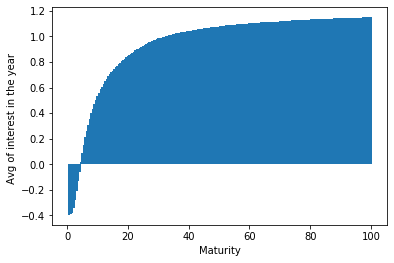

In [11]:
plt.bar(mat,l1)
plt.xlabel("Maturity")
plt.ylabel(" Avg of interest in the year  ")
plt.show()

Saturation point hence recieved is : ---> 47
weeks

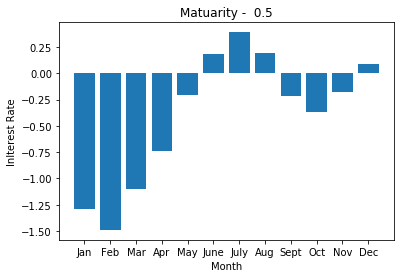

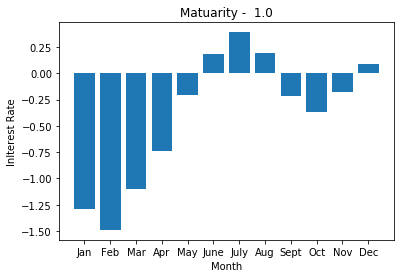

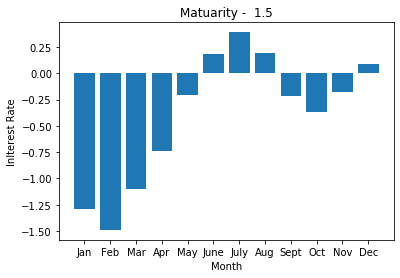

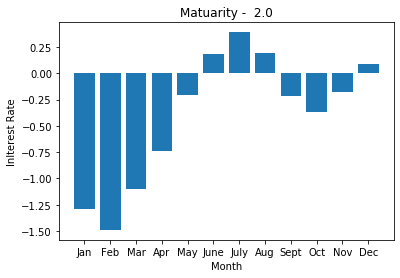

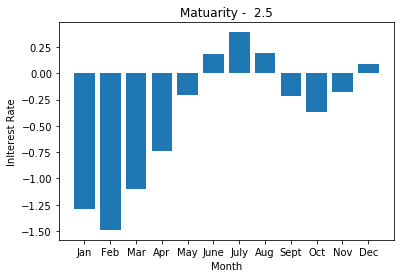

...

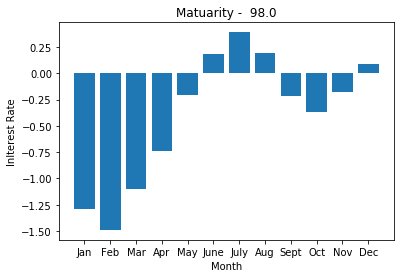

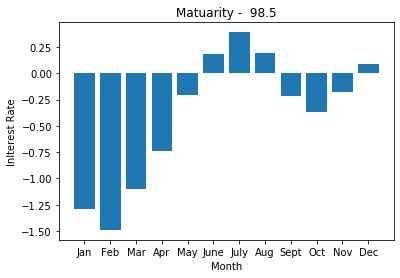

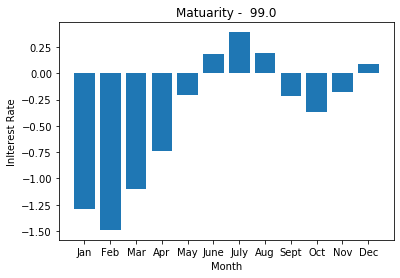

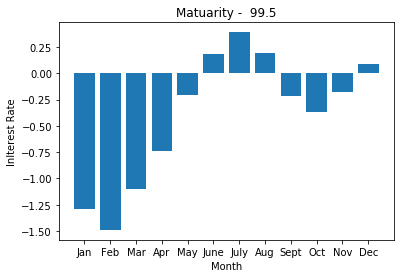

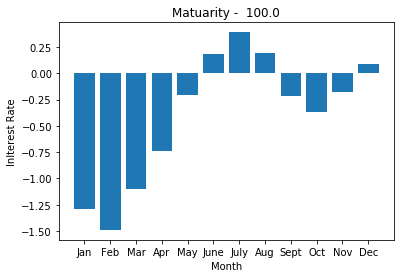

In [12]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.bar(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()
   

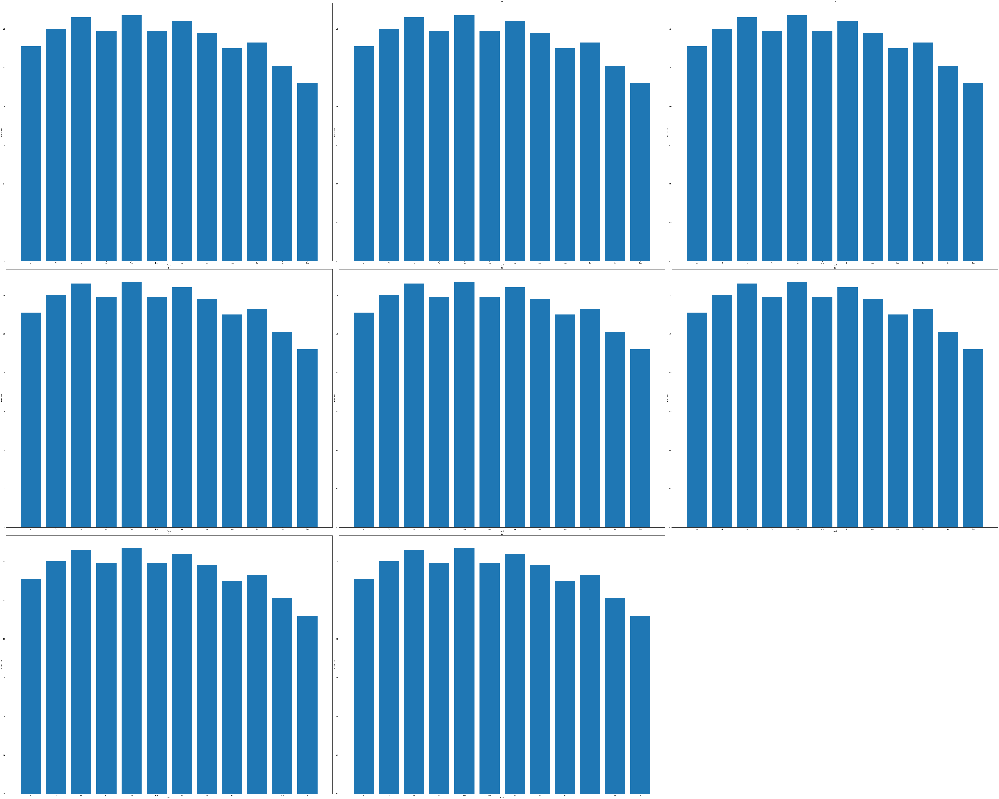

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,80))

for c,num in zip(mat, range(1,9)):
    df0=df[df['Matuarity']==c]
    l = list(df.iloc[i-1,1:-1])
    ax = fig.add_subplot(3,3,num)
    ax.bar(name , l)
    ax.set_xlabel("Month")
    ax.set_ylabel("Inlterest Rate")
    ax.set_title(c)

plt.tight_layout()
plt.show()

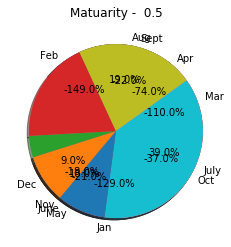

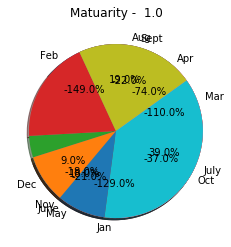

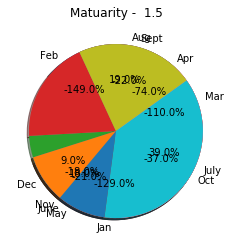

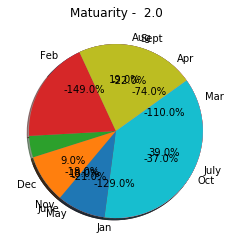

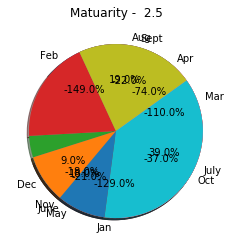

...

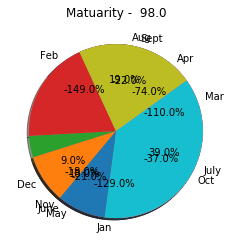

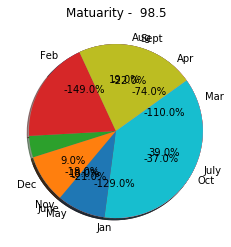

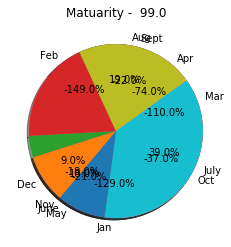

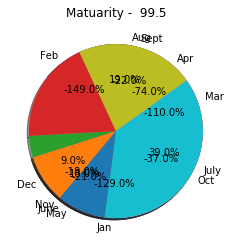

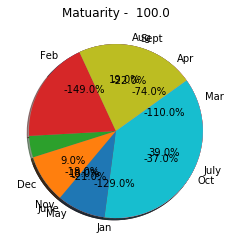

In [14]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.pie(l, labels=name, 
    autopct='%1.1f%%', shadow=True, startangle=140)
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    theme = plt.get_cmap('copper')
    plt.show()
   

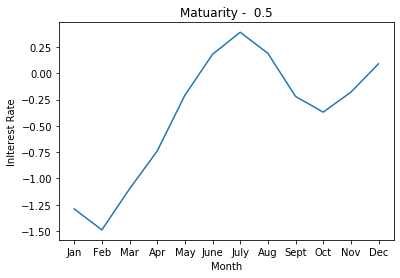

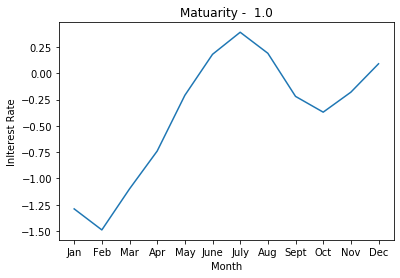

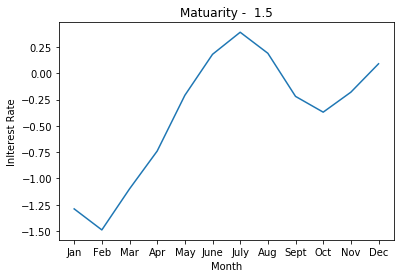

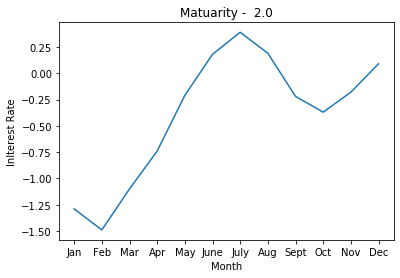

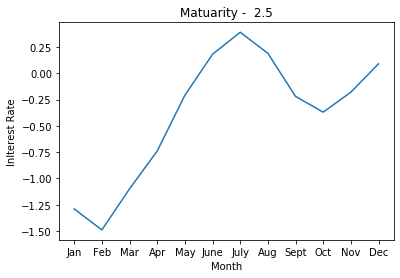

...

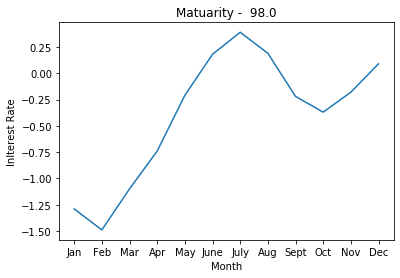

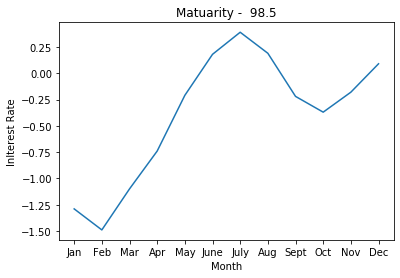

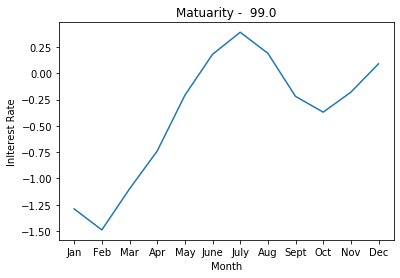

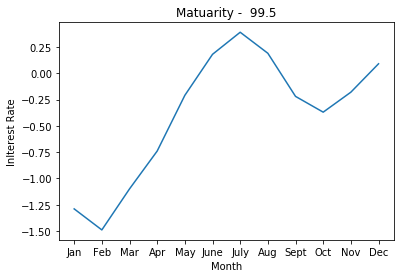

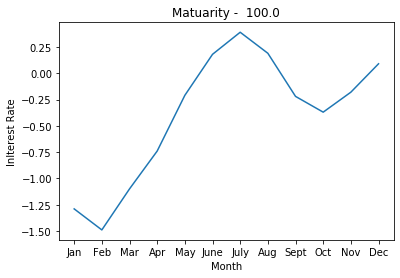

In [15]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.plot(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()

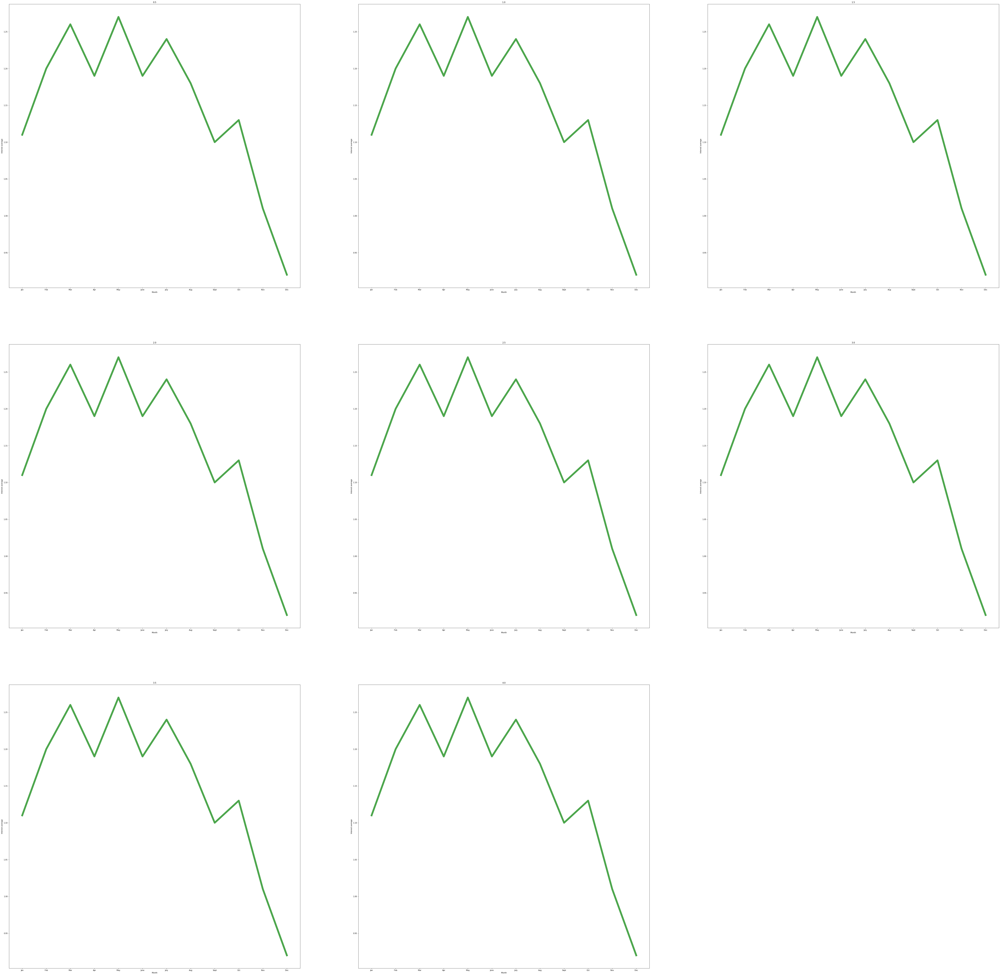

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,100))

for c,num in zip(mat, range(1,9)):
    df0=df[df['Matuarity']==c]
    l = list(df.iloc[i-1,1:-1])
    ax = fig.add_subplot(3,3,num)
    ax.plot(name, l ,color = 'g',linewidth=10, alpha=0.7 )
    ax.set_xlabel('Month')
    ax.set_ylabel('Interest average')
    ax.set_title(c)


plt.show()

In [17]:
df['sum'].sum()/200

0.9417583333333335